<a href="https://colab.research.google.com/github/ssaabbii/yolov5/blob/master/task2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [4]:
!git clone https://github.com/ultralytics/yolov5  # clone
%cd yolov5
%pip install -qr requirements.txt  # install

import torch
from yolov5 import utils
display = utils.notebook_init()  # checks

YOLOv5 🚀 v6.1-132-g014acde torch 1.10.0+cu111 CUDA:0 (Tesla K80, 11441MiB)


Setup complete ✅ (2 CPUs, 12.7 GB RAM, 39.9/78.2 GB disk)


In [5]:
%cd /content/yolov5

/content/yolov5


In [6]:
from IPython.display import Image  # for displaying images
print('torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

torch 1.10.0+cu111 _CudaDeviceProperties(name='Tesla K80', major=3, minor=7, total_memory=11441MB, multi_processor_count=13)


In [7]:
!curl -L "https://public.roboflow.com/ds/MMRZBjxuLf?key=Gr3Cy4102E" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip

Выходные данные были обрезаны до нескольких последних строк (5000).
 extracting: train/labels/2019-03-20_23-53-40to2019-03-20_23-53-56_1-0229_jpg.rf.d845c83b73bdf2757a6e82577abcc10d.txt  
 extracting: train/labels/2019-03-20_23-53-40to2019-03-20_23-53-56_1-0230_jpg.rf.7c035d500f3aa036010c6fce4ac55c3b.txt  
 extracting: train/labels/2019-03-20_23-53-40to2019-03-20_23-53-56_1-0231_jpg.rf.2fb322ca98e247c505e1b80b01125cb2.txt  
 extracting: train/labels/2019-03-20_23-53-40to2019-03-20_23-53-56_1-0232_jpg.rf.e27c92e2122dfeddf2cc678fc0d65606.txt  
 extracting: train/labels/2019-03-20_23-53-40to2019-03-20_23-53-56_1-0234_jpg.rf.7135475e636ad21633ebf6fb33e7bcab.txt  
 extracting: train/labels/2019-03-20_23-53-40to2019-03-20_23-53-56_1-0235_jpg.rf.2de3d7a776322f01ac148ae99fd8977c.txt  
 extracting: train/labels/2019-03-20_23-53-40to2019-03-20_23-53-56_1-0237_jpg.rf.f0cbb756fad71abe7408128f5190411c.txt  
 extracting: train/labels/2019-03-20_23-53-40to2019-03-20_23-53-56_1-0238_jpg.rf.d14d1122db7

In [8]:
%cat data.yaml

train: ../train/images
val: ../valid/images

nc: 6
names: ['crab', 'fish', 'jellyfish', 'shrimp', 'small_fish', 'starfish']

In [10]:
!pip install roboflow
from roboflow import Roboflow
rf = Roboflow(api_key = 'KaNeDLi23a9Nzo4sUkIT')

project = rf.workspace().project('brackish-underwater') # название датасета, например датасет с разными типами автомобилей
dataset = project.version(1).download('yolov5')

     |████████████████████████████████| 145 kB 5.2 MB/s 
     |████████████████████████████████| 178 kB 41.8 MB/s 
     |████████████████████████████████| 1.1 MB 46.8 MB/s 
     |████████████████████████████████| 67 kB 6.1 MB/s 
     |████████████████████████████████| 54 kB 2.6 MB/s 
     |████████████████████████████████| 138 kB 50.1 MB/s 
     |████████████████████████████████| 63 kB 1.7 MB/s 
  Created wheel for roboflow: filename=roboflow-0.2.4-py3-none-any.whl size=21356 sha256=ce28b0fe272f97e7ba242318cdff537ce229bc0b85a1cc19caccae3d5353c3c2
  Stored in directory: /root/.cache/pip/wheels/b7/2c/60/3733c0e323b1d7aec00f852264314bf6c48192c8e1dc92b3ee
  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9675 sha256=7cec8ba78949b5a52a5b604fb5edf190f9f7a5714c97f621ada5a3d0cc7daa7f
  Stored in directory: /root/.cache/pip/wheels/a1/b6/7c/0e63e34eb06634181c63adacca38b79ff8f35c37e3c13e3c02
Successfully built roboflow wget
  Attempting uninstall: urllib3
    Found existing instal

loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to Brackish-Underwater-1 in yolov5pytorch:: 100%|██████████| 29359/29359 [00:37<00:00, 789.63it/s] 


In [11]:
dataset.location

'/content/yolov5/Brackish-Underwater-1'

In [12]:

%time
!python train.py --img 416 --batch 16 --epochs 20 --data /content/yolov5/Brackish-Underwater-1/data.yaml --weights yolov5s.pt --cache

CPU times: user 2 µs, sys: 0 ns, total: 2 µs
Wall time: 5.48 µs
train: weights=yolov5s.pt, cfg=, data=/content/yolov5/Brackish-Underwater-1/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=20, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.1-132-g014acde torch 1.10.0+cu111 CUDA:0 (Tesla K80, 11441MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, 

In [13]:
# Start tensorboard
# Launch after you have started training to all the graphs needed for inspection
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir /content/yolov5/runs/train/exp

<IPython.core.display.Javascript object>

In [21]:
# use the best weights!
# Final weights will be by-default stored at /content/yolov5/runs/train/exp2/weights/best.pt
%cd /content/yolov5/
!python detect.py --weights /content/yolov5/runs/train/exp2/weights/best.pt --img 416 --conf 0.4 --source ./test/images

/content/yolov5
detect: weights=['/content/yolov5/runs/train/exp2/weights/best.pt'], source=./test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.1-132-g014acde torch 1.10.0+cu111 CUDA:0 (Tesla K80, 11441MiB)

Traceback (most recent call last):
  File "detect.py", line 252, in <module>
    main(opt)
  File "detect.py", line 247, in main
    run(**vars(opt))
  File "/usr/local/lib/python3.7/dist-packages/torch/autograd/grad_mode.py", line 28, in decorate_context
    return func(*args, **kwargs)
  File "detect.py", line 92, in run
    model = DetectMultiBackend(weights, device=device, dnn=dnn, data=data, fp16=half)
  File "/content/yolov5/mo

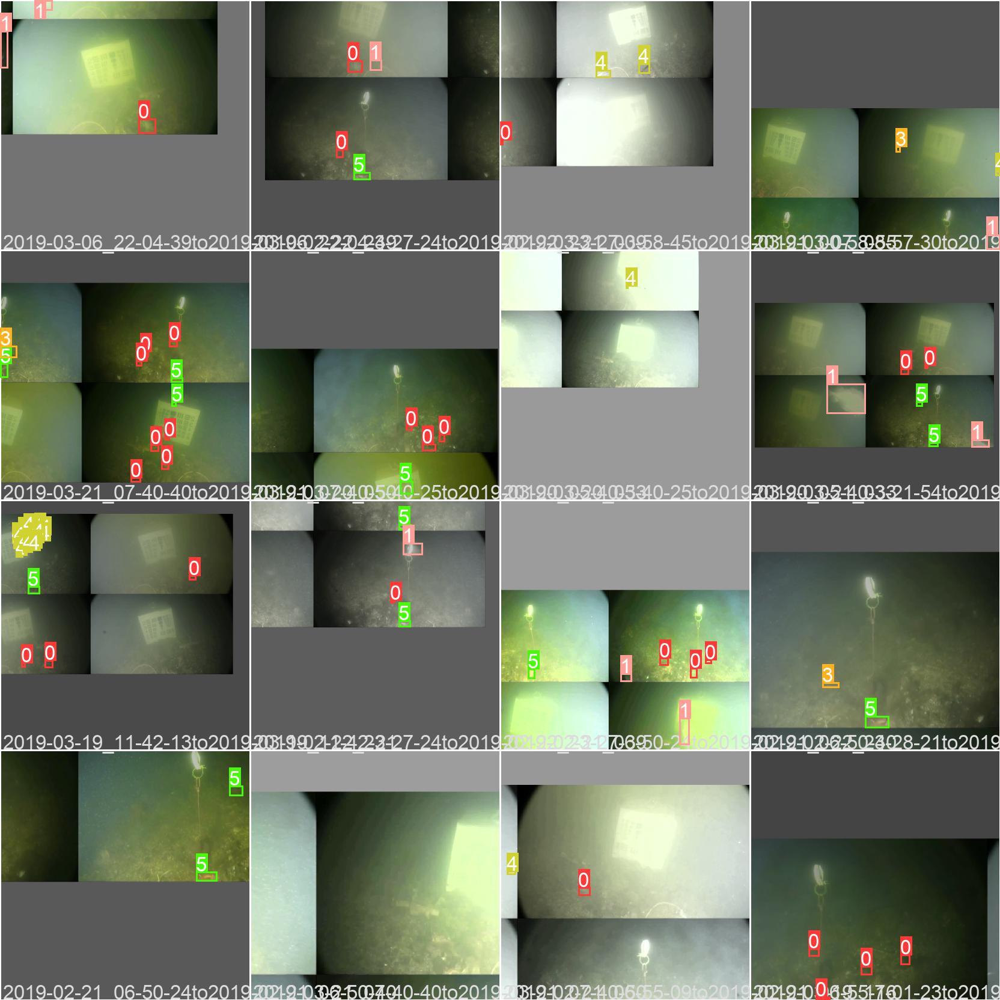

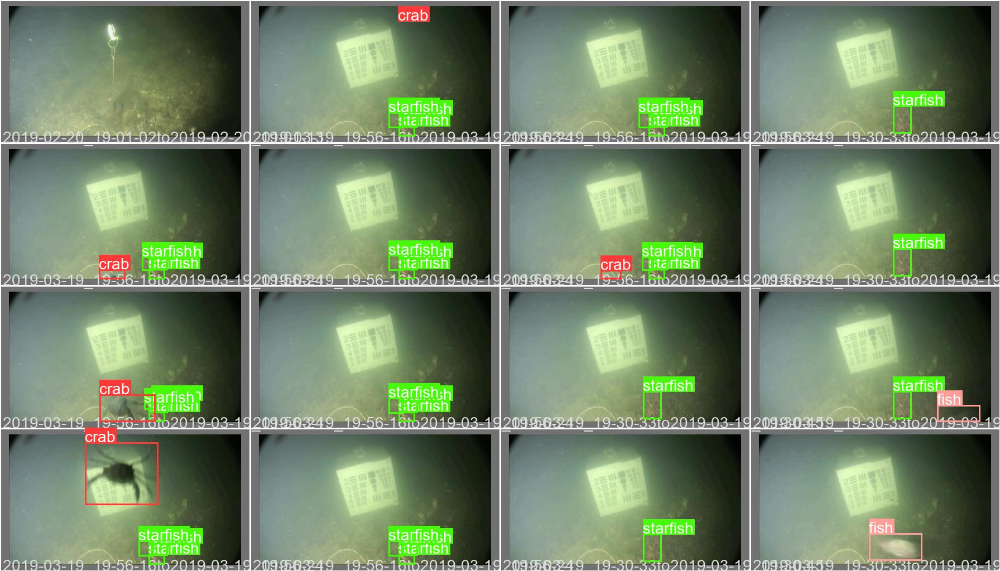

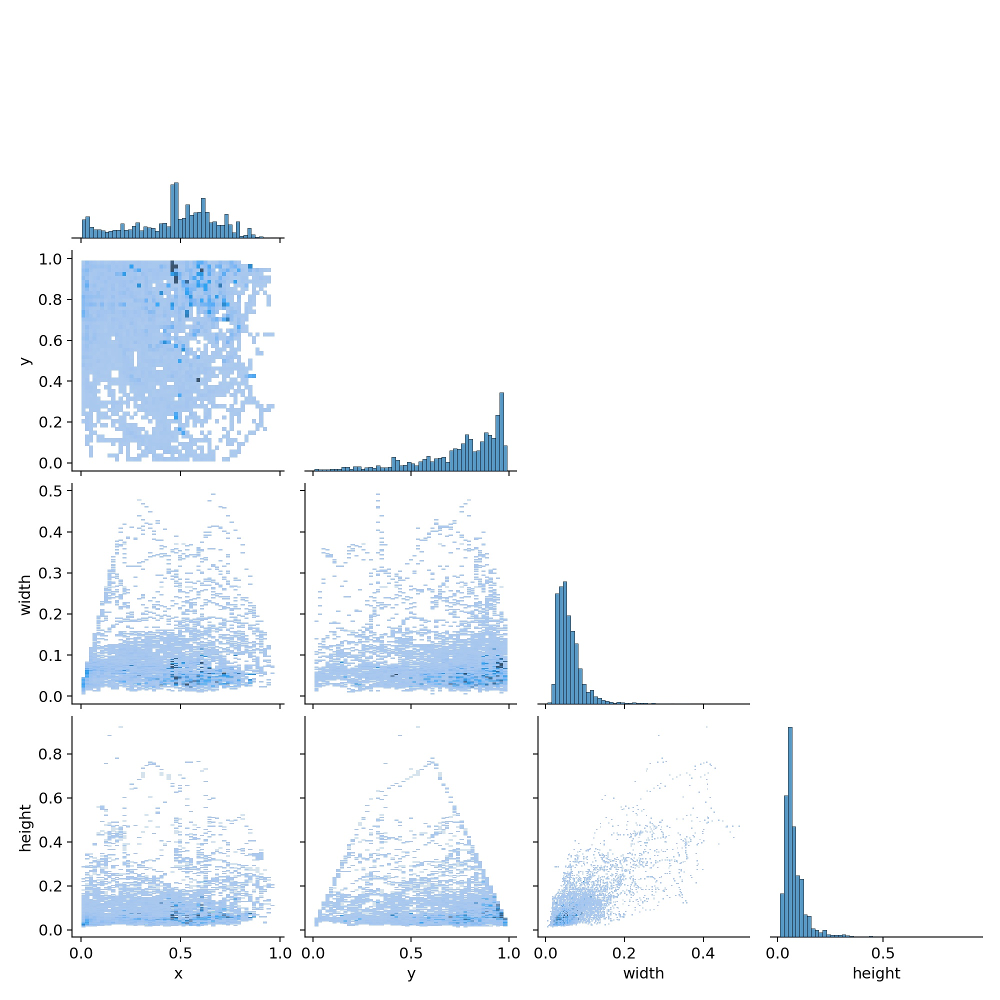

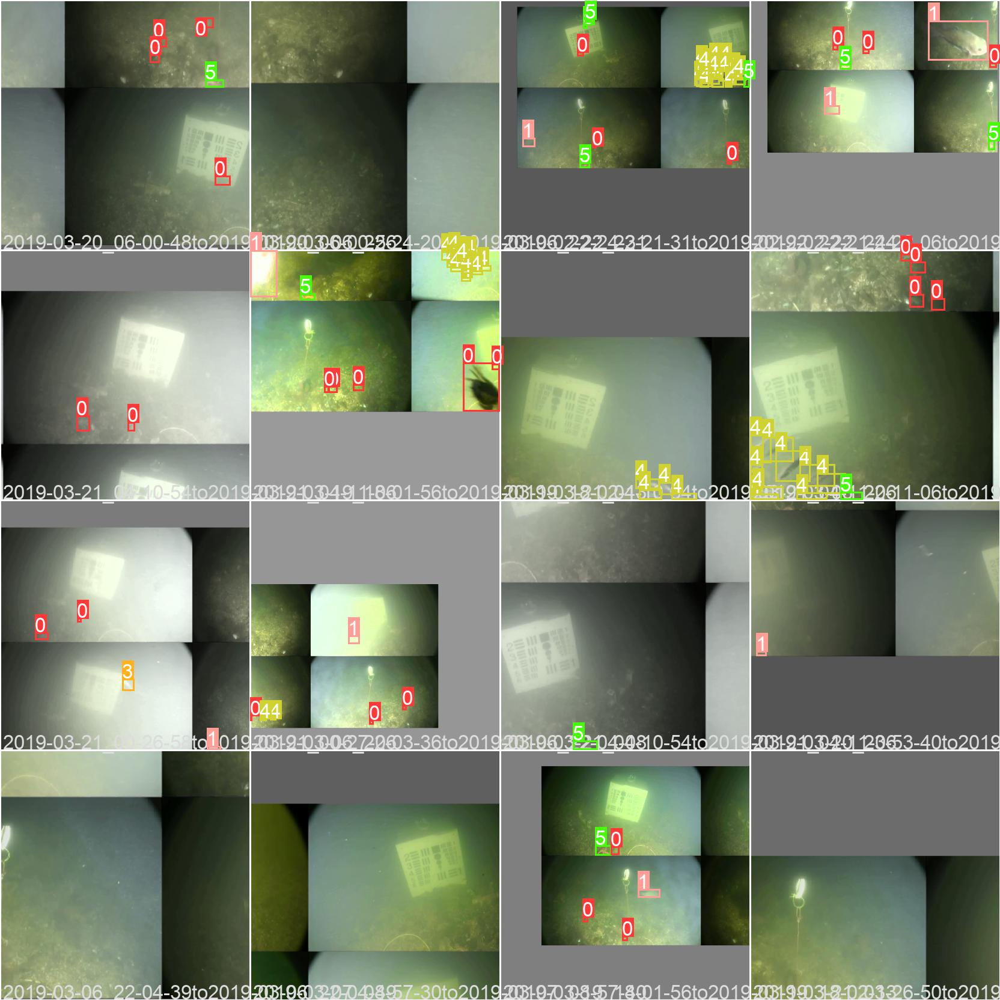

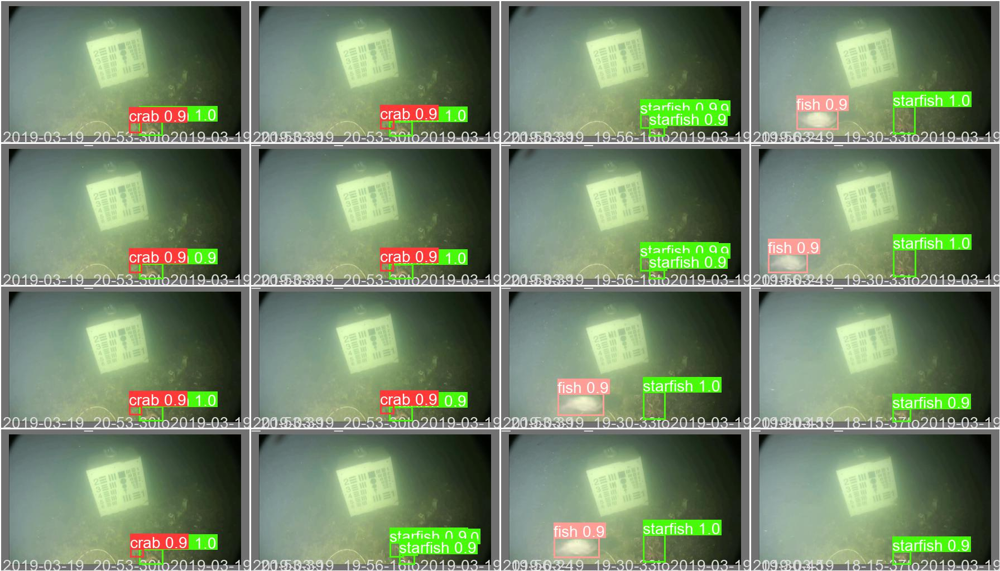

...

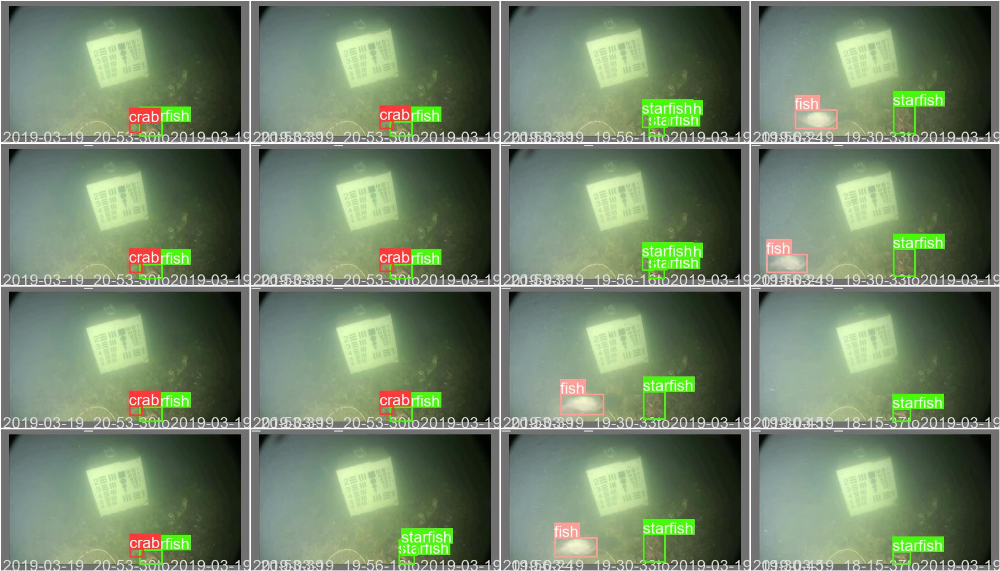

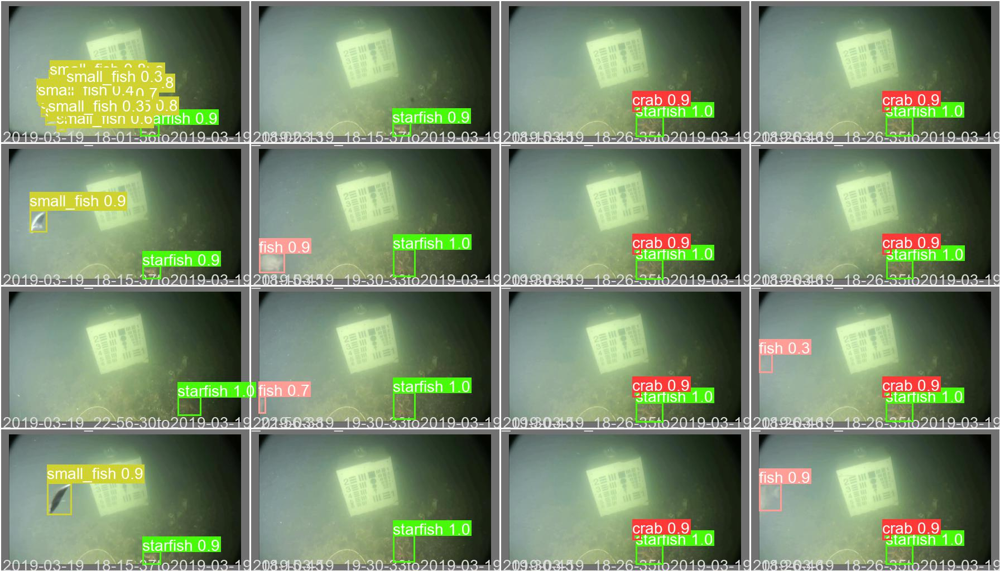

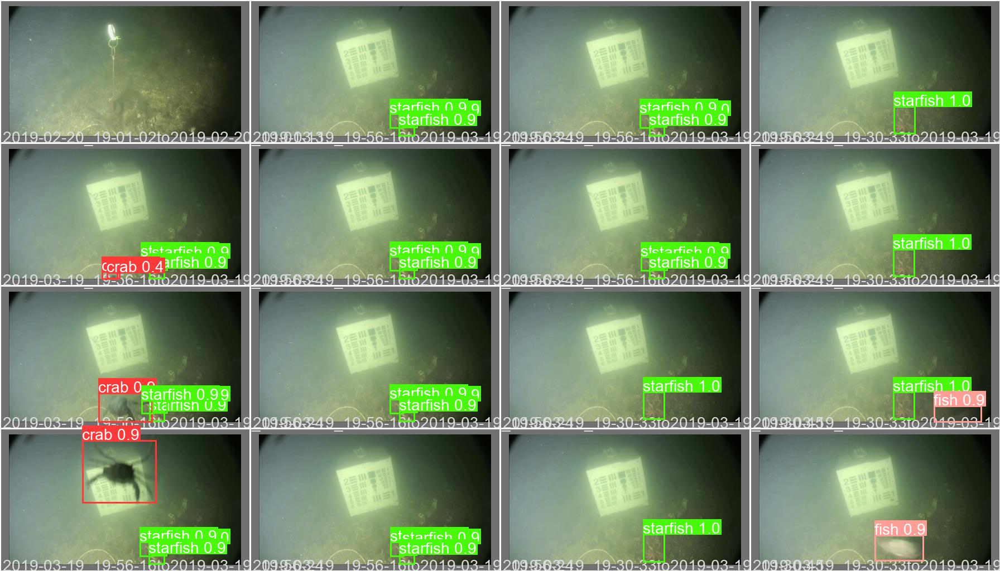

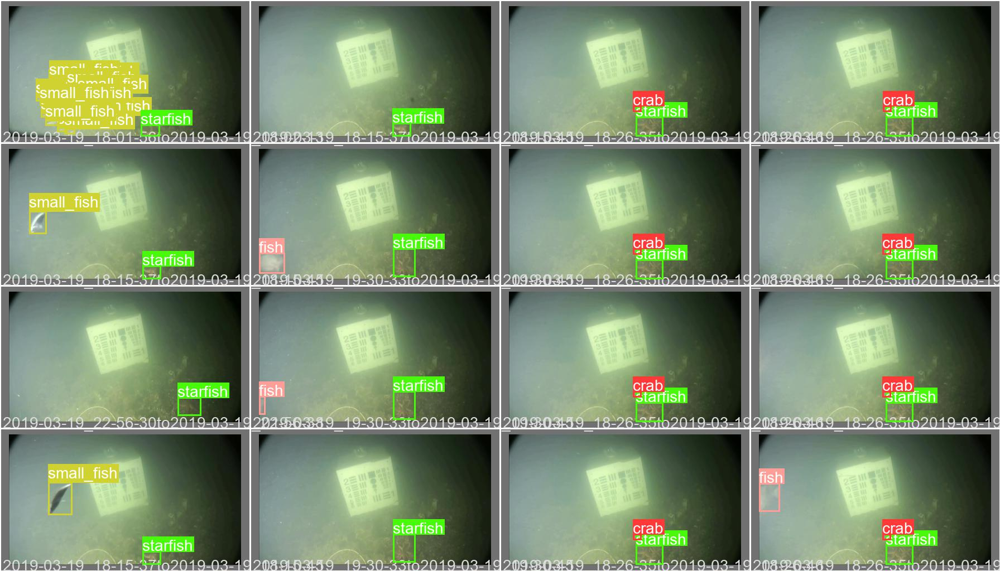

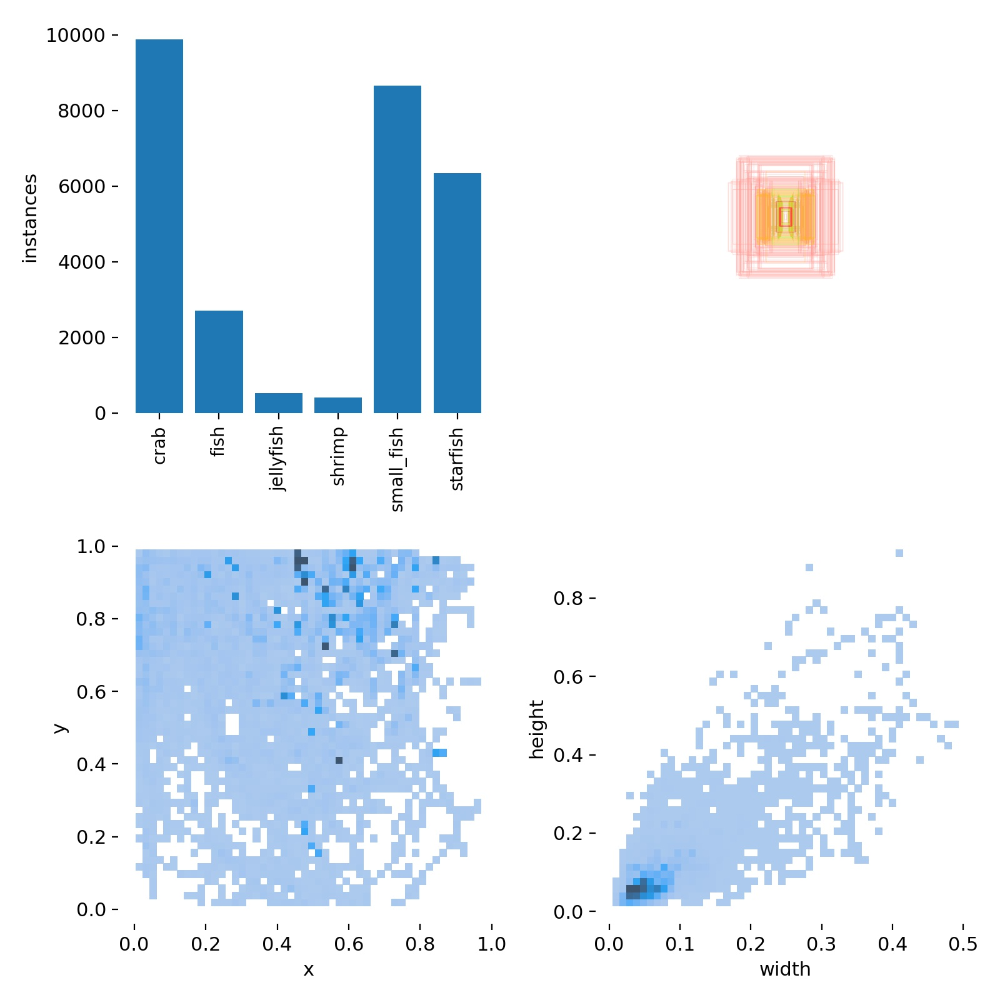

In [30]:
#display inference on ALL test images
#this looks much better with longer training above

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/train/exp/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

In [34]:
from google.colab import drive
drive.mount('/content/gdrive')

%cp /content/yolov5/runs/train/exp/weights/best.pt /content/gdrive/My\ Drive

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).
